## gs_SlidetoIcePipeline02_Inference
Dependency Install Instructions:  
    1.) IceVision Install - Use Option 2 - https://airctic.com/install/ (I recommend installing icevision under main ml-pipeline directory)  
    2.) Modify draw_data.py file by adding: "draw_label", "_draw_label" to public methods at top of file  
- Adding ROI Original Annotations Export Routine (1/6/2021)

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
import sqlite3
import numpy as np
from SlideRunner.dataAccess.database import Database
from tqdm import tqdm
from pathlib import Path
import openslide
import time
import pdb
from datetime import *
from random import randint
import copy


In [3]:
from icevision.all import *
from icevision.visualize.draw_data import *
from wsi_extractor import *

In [4]:
from lib_pipeline_ice_helper import *

## Configuration Parameters

In [5]:
from lib_pipeline_ice_config import *
#Display Config Parameters (edit file)
with open('./lib_pipeline_ice_config.py') as f:
    print(f.read())

from pathlib import Path
from datetime import *
import pytz

params = dict(
    size=512,
    size_trans=512,
    size_progresize=0,
    batch_size=8,
    ds_size=500,
    run='1',
    infrastructure='AZ-MLDev01',
    )
params.update(project= 'mitosis_preprod01')
params['run_datetime'] = datetime.now(pytz.timezone('US/Pacific')).strftime("%m%d%Y-%H%M")

anno_radius = 25  #1/7/21 - changed from 50px BB to 40px BB to test accuracy
params['bbox_hw'] = anno_radius

#4 Cls Definition
# classes = {1: 'granulocyte',2:  'mitotic figure', 3: 'tumor cell', 7: 'Mitotic figure lookalike'}
# class_map_list = ['granulocyte','mitotic figure', 'tumor cell', 'Mitotic figure lookalike']
#1 Cls Definition
classes = {2:  'mitotic figure'}
class_map_list = ['unknown','mitotic figure']

params.update(class_map=class_map_list)

size = params['size']  #Doesn't work with 1024 - runs out of memory
path = Path('./')

dbname = 'MITOS_WSI_CCMCT_ODAEL.sqlite'

#Laptop Paths
# path_WSI = '/mnt/d/Development/Mitosis 

In [6]:
size = params['size']  #Doesn't work with 1024 - runs out of memory
size_trans = params['size_trans']

SPOT = 1
RECT = 2
CIRC = 5
POLY = 3

#Model Types: efficientdet, faster_rcnn, retinanet
model_type = efficientdet

## Select Annotation Data from SlideRunner DB

In [7]:
slide_count = 0
if slide_count > 0:
    getslides = "SELECT uid, filename FROM Slides LIMIT " + str(slide_count)
else:
#     getslides = "SELECT uid, filename FROM Slides"
    getslides = 'SELECT uid, filename FROM Slides WHERE filename IN ("f3741e764d39ccc4d114.svs","c91a842257ed2add5134.svs")'

print(getslides)

SELECT uid, filename FROM Slides WHERE filename IN ("f3741e764d39ccc4d114.svs","c91a842257ed2add5134.svs")


In [8]:
database = Database()
print(str(pathDB/dbname))
database.open(str(pathDB/dbname))

/workspace/MITOS_WSI_CCMCT/databases/MITOS_WSI_CCMCT_ODAEL.sqlite


In [9]:
dir_slides = os.listdir(pathWSI)
database_slides = [s[1] for s in database.execute(getslides).fetchall()]
annotated_and_existing_slides = list(set(dir_slides) & set(database_slides))
slide_list = "', '".join(map(str, annotated_and_existing_slides))

query_slides = "SELECT uid, filename FROM Slides WHERE filename IN ('" + slide_list + "')"
print(query_slides)

SELECT uid, filename FROM Slides WHERE filename IN ('f3741e764d39ccc4d114.svs', 'c91a842257ed2add5134.svs')


In [10]:
files = []
lbl_bbox = []
patch_spot_size = params['size']

# classes_roi = {2: 'mitotic figure', 11:  'background'}
classes_roi = {11:  'background'}

for currslide, filename in tqdm(database.execute(query_slides).fetchall()):
    database.loadIntoMemory(currslide)

    slide_path = pathWSI / filename

    slide = openslide.open_slide(str(slide_path))
    level = 0#slide.level_count - 1
    level_dimension = slide.level_dimensions[level]
    down_factor = slide.level_downsamples[level]
    
    dict_annotations = dict()
    select_annotations = []
#     select_annotations = [387668, 387667]  #annotations from AIWorkstation
#     select_annotations = [387666, 387667]  #Annotations from azVM

    for id, annotation in database.annotations.items():
        if annotation.uid in select_annotations:
            dict_annotations.setdefault(id,annotation) 
    if len(dict_annotations) > 0:
        dict_annotations = dict_annotations
    else:
        dict_annotations = database.annotations.items()
    
    
    # Extract Class Annotations 
    bboxes, labels = [], []         
    for id, annotation in dict_annotations:
        if annotation.deleted == 0:
            if annotation.agreedClass in classes:
                if annotation.annotationType == CIRC:          
                    print(annotation.r) 
                    x_min = (annotation.x1 - annotation.r) / down_factor
                    y_min = (annotation.y1 - annotation.r) / down_factor
                    x_max = (annotation.x1 + annotation.r) / down_factor
                    y_max = (annotation.y1 + annotation.r) / down_factor
                    # print('CIRC=', annotation.uid, '-', x_min,y_min,x_max,y_max)
                    # label = classes[annotation.labels[0].classId]
#                     label_id = annotation.labels[0].classId
                    label_id = annotation.agreedClass
                    bboxes.append([int(x_min), int(y_min), int(x_max), int(y_max)])
                    labels.append(label_id)
                elif annotation.annotationType == RECT:
                    x_min = (annotation.x1) / down_factor
                    y_min = (annotation.y1) / down_factor
                    x_max = (annotation.x2) / down_factor
                    y_max = (annotation.y2) / down_factor
                    print('RECT=', annotation.uid, '-',x_min,y_min,x_max,y_max)
#                     label_id = annotation.labels[0].classId
                    label_id = annotation.agreedClass
                    bboxes.append([int(x_min), int(y_min), int(x_max), int(y_max)])
                    labels.append(label_id)
                elif annotation.annotationType == SPOT:
                    d = 2 * anno_radius / down_factor
                    x_min = (annotation.x1 - anno_radius) / down_factor
                    y_min = (annotation.y1 - anno_radius) / down_factor
                    x_max = x_min + d
                    y_max = y_min + d
                    # print('SPOT=', annotation.uid, '-', x_min,y_min,x_max,y_max)
#                     label_id = annotation.labels[0].classId
                    label_id = annotation.agreedClass
                    bboxes.append([int(x_min), int(y_min), int(x_max), int(y_max)])
                    labels.append(label_id)
                else:
                    print('AnnoUID=', annotation.uid, 'Other annotations types not currently supported')
    #Extract ROI with Background Annotation Type
    dict_anno_roi = []
    for id_roi, anno_roi in dict_annotations:
        if anno_roi.deleted == 0:
            if anno_roi.labels[0].classId in classes_roi:
                if anno_roi.annotationType == RECT:
                    if anno_roi.x1 != anno_roi.x2:
                        dict_anno_roi.append(anno_roi)

    #Extract Dimensions of ROI and Append Annotations
    for anno_roi in dict_anno_roi:
        bboxes_roi, labels_roi = [], []  
        if anno_roi.annotationType == RECT:
            x_min = (anno_roi.x1) / down_factor
            y_min = (anno_roi.y1) / down_factor
            x_max = (anno_roi.x2) / down_factor
            y_max = (anno_roi.y2) / down_factor
            x1y1 = [int(x_min),int(y_min)]
            # label_id = anno_roi.labels[0].classId
            # bboxes_roi.append([int(x_min), int(y_min), int(x_max), int(y_max)])
            # labels_roi.append(label_id)
        print('ROI=', anno_roi.uid, '-',x_min,y_min)
        height = int(y_max - y_min)
        width = int(x_max - x_min)

        # if len(bboxes_roi) > 0:
        #     bboxes_roi.extend(bboxes)
        #     labels_roi.extend(labels)
        #     # lbl_bbox.append([bboxes, labels])

        files.append(SlideContainerIce(slide_path, y=[bboxes, labels],  level=level, width=width, height=height, x1y1=x1y1))


ROI= 387669 - 45995.0 43987.0
ROI= 387670 - 60864.0 37995.0
ROI= 387671 - 79007.0 45788.0
ROI= 387666 - 17093.0 22679.0
ROI= 387667 - 4710.0 28345.0
ROI= 387668 - 7799.0 18396.0



In [11]:
#TODO - IceVision Parser is not displaying all background annotations
# parser = SlideContainerParser(files)
# train_rs = parser.parse(data_splitter=SingleSplitSplitter(), autofix=True)
# show_records(train_rs[0])

In [12]:
#Create New Project Folder 
project_fldr_name = 'WSI_ROI_' + str(size) + 'px' + '_' + params['run_datetime']
new_project_fldr = Path(path/'WSI_PATCHES'/project_fldr_name)
print(new_project_fldr)

WSI_PATCHES/WSI_ROI_512px_01122021-1248


## WSI to Patches

In [14]:
if not os.path.exists(new_project_fldr):
    os.mkdir(new_project_fldr)
    os.mkdir(new_project_fldr/'ROI')

In [15]:
#Extract ROI from SlideRunner Obj and Save to File
for idx, roi in enumerate(files):
    x_min = roi.x1y1[0]
    y_min = roi.x1y1[1]
    x_max = roi.x1y1[0] + roi.width
    y_max = roi.x1y1[1] + roi.height

    slide = openslide.open_slide(str(roi.file))
    level = 0    #slide.level_count - 1
    slide_width, slide_height = slide.level_dimensions[level]

    img_roi = slide.read_region(location=(int(x_min),int(y_min)), level=level, size=(roi.width, roi.height))

    patch_filename = str(Path(roi.file).stem) + '_' + '{}-{}.png'.format(x_min, y_min)
    img_roi.save(os.path.join(new_project_fldr/'ROI', patch_filename), 'PNG')



In [16]:
#Create Patches from WSI or ROI JPEG
slide_folder = os.path.join(os.curdir, new_project_fldr,'ROI')
save_folder = os.path.join(os.curdir, new_project_fldr, 'patches')
# TileSaving(slide_folder, save_folder, n_procs=1, target_size=256, ds_rate=0, black_thresh=50).tiling()
TileSaving(slide_folder, save_folder, n_procs=1, target_size=params['size'], ds_rate=0, rm_black=False, rm_blank=False).tiling()

  Can not find save folder, will create ./WSI_PATCHES/WSI_ROI_512px_01112021-1617/patches.
 
WSI Extractor
-------------------- 
Find 6 slides. 
--------------------

Loaded slide: c91a842257ed2add5134_79007-45788.png ... 
  width: 4061, height: 5207, 
  rows: 7, columns: 10, 
  ds scale: 1, patch size: 512
  Creating save folder ...   done
  Using default settings, used 1 process, 7 columns per process.
  Finished 0 - 7 columns, used time: 1.87 s.

Loaded slide: f3741e764d39ccc4d114_17093-22679.png ... 
  width: 5381, height: 4288, 
  rows: 10, columns: 8, 
  ds scale: 1, patch size: 512
  Creating save folder ...   done
  Using default settings, used 1 process, 10 columns per process.
  Finished 0 - 10 columns, used time: 2.00 s.

Loaded slide: c91a842257ed2add5134_45995-43987.png ... 
  width: 9138, height: 6485, 
  rows: 17, columns: 12, 
  ds scale: 1, patch size: 512
  Creating save folder ...   done
  Using default settings, used 1 process, 17 columns per process.
  Finished 0 -

## Visualize Annotations on Original ROI

## Load ROI & ROI Patch Paths

In [14]:
roi_projects_fldr = path/'WSI_PATCHES'
for roi_folder in roi_projects_fldr.iterdir(): 
    if roi_folder.is_dir():
        print(roi_folder.stem)

WSI_ROI_512px_01112021-1617
WSI_ROI_256px
WSI_ROI_512px
WSI_ROI_1024px_01082021-1349
WSI_ROI_768px


In [15]:
# Create Paths for ROI and Patches
project_fldr = roi_projects_fldr/'WSI_ROI_512px_01112021-1617'
roi_path = project_fldr/'ROI'
roi_patches_path = project_fldr/'patches'



## Display ROI with Ground Truth Annotations

In [17]:
#Create Output folder and filenames
output_fldr = project_fldr/'output'
output_gt_fldr = output_fldr/'gt'

if not os.path.exists(output_fldr):
    os.mkdir(output_fldr)
    os.mkdir(output_gt_fldr)

In [18]:
#Draw GT Annotations on ROI & Save Image
for roi_gt in files:
    roi_gt_filename_stem = str(Path(roi_gt.file.name).stem) + '_' + str(roi_gt.x1y1[0]) + '-' + str(roi_gt.x1y1[1])
    roi_gt_filename = roi_gt_filename_stem + '.png'
    xy, bbs, lbls = roi_gt.get_roi_bboxeslabels(roi_gt.x1y1[0], roi_gt.x1y1[1])

    roi_img_gt = open_img(roi_path/roi_gt_filename)
    for idx, bb in enumerate(bbs):
        color_gt = (0,0,255)
        label_txt = classes[lbls[idx]]
        bbox_ice = BBox.from_xyxy(int(bb[0]), int(bb[1]), int(bb[2]), int(bb[3]))

        roi_img_gt = draw_bbox(img=roi_img_gt, bbox=bbox_ice, color=color_gt)

        x, y, _, _ = bbox_ice.xyxy
        roi_img_gt = _draw_label(img=roi_img_gt, caption=label_txt, x=x, y=y, color=color_gt)
    
    loc_title = (int(roi_gt.width/2)-250,30)
    roi_img_gt = cv2.putText(roi_img_gt, roi_gt_filename_stem + '.jpg', loc_title, cv2.FONT_HERSHEY_SIMPLEX , 1, (0,0,255), 2)

    output_gt_filename = 'gt_' + roi_gt_filename_stem + '.jpg'
    roi_img_gt = cv2.cvtColor(roi_img_gt, cv2.COLOR_BGR2RGB)
    cv2.imwrite(str(output_gt_fldr/output_gt_filename), roi_img_gt) 

In [19]:
#Display ROI with Ground Truth Annotations
if os.path.exists(output_gt_fldr):
    for output_gt_file in output_gt_fldr.iterdir(): 
        fig,ax = plt.subplots(figsize=[20,20])
        ax.set_title(output_gt_file)
        img_output_gt = open_img(output_gt_file)
        show_img(img_output_gt, ax)

## Load ROI Patches Into DataLoader

In [16]:
#Display available patch folders
for patch_folder in roi_patches_path.iterdir(): 
    if patch_folder.is_dir():
        print(patch_folder.stem)

f3741e764d39ccc4d114_7799-18396_1_3_x1_sz512
f3741e764d39ccc4d114_17093-22679_10_8_x1_sz512
c91a842257ed2add5134_45995-43987_17_12_x1_sz512
c91a842257ed2add5134_79007-45788_7_10_x1_sz512
c91a842257ed2add5134_60864-37995_21_8_x1_sz512
f3741e764d39ccc4d114_4710-28345_6_8_x1_sz512


In [17]:
## Copy selected patch folder from above
## Create folder and filename for ROI and ROI Patches
selected_patch_folder = 'c91a842257ed2add5134_79007-45788_7_10_x1_sz512'
# selected_patch_folder = ''
if selected_patch_folder == '':
    selected_patch_folder = patch_folder.stem
# print(selected_patch_folder)
roi_patches_folder = roi_patches_path/selected_patch_folder
split_roi_folder = str(roi_patches_folder.stem).split('_')
roi_filename = split_roi_folder[0] + '_' + split_roi_folder[1] + '.png'
print(roi_filename)

c91a842257ed2add5134_79007-45788.png


In [18]:
images = []
filenames = []
for filename in os.listdir(roi_patches_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        imgfile = os.path.join(roi_patches_folder, filename)
        images.append(open_img(imgfile))
        filenames.append(filename)
    else:
        continue
images = np.array(images)
print(images.shape)
filenames2images = dict(zip(filenames, images))

(70, 512, 512, 3)


In [19]:
#Transforms used on train/valid ds
infer_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(params['size']), tfms.A.Normalize()])
infer_ds = Dataset.from_images(images, infer_tfms)

In [20]:
# samples = [infer_ds[0] for _ in range(3)]
# show_samples(samples, ncols=3, class_map=class_map)

## Import Model

In [21]:
p = Path('./models/final')
# [x for x in p.iterdir() if x.is_dir()]
[x for x in p.iterdir()]

[Path('models/final/EffDet-tf_efficientdet_d3_4cls_512px_2500ds_01072021-1733.pth'),
 Path('models/final/EffDet-tf_efficientdet_d3_512px_5000ds_12242020-02:05.pth'),
 Path('models/final/EffDet-tf_efficientdet_d4_1cls_768px_500ds_1_12222020.pth'),
 Path('models/final/EffDet-tf_efficientdet_d3_1024px_500ds_01062021-22:38.pth'),
 Path('models/final/EffDet-tf_efficientdet_d3_512px_1000ds_12232020-2351.pth'),
 Path('models/final/RetNet_resnet50_1cls_500ds_01112021-1603.pth'),
 Path('models/final/EffDet-tf_efficientdet_d3_768px_5000ds_01062021-08:55.pth'),
 Path('models/final/EffDet-tf_efficientdet_d3_1024px_1000ds_01072021-0959.pth'),
 Path('models/final/EffDet-tf_efficientdet_d3_768px_2500ds_01062021-08:42.pth'),
 Path('models/final/FastRCNN_resnet50_1cls_500ds_01112021-1438.pth'),
 Path('models/final/EffDet-tf_efficientdet_d3_768px_1000ds_01052021-15:02.pth'),
 Path('models/final/EffDet-tf_efficientdet_d3_768px_500ds_01052021-12:28.pth'),
 Path('models/final/EffDet-tf_efficientdet_d3_512p

In [45]:
path_model = Path('./models/final/EffDet-tf_efficientdet_d3_1cls_512px_500ds_1_12232020-1710.pth')

In [46]:
#Class Map
class_map = ClassMap(class_map_list)
print(class_map)


<ClassMap: {'background': 0, 'unknown': 1, 'mitotic figure': 2}>


In [54]:
#Load Saved Model
if model_type.__name__.split('.')[2] == 'efficientdet':
    params['model'] = 'tf_efficientdet_d3'
    model_inf = model_type.model(model_name=params['model'],  num_classes=len(params['class_map']),  img_size=params['size'])
elif model_type.__name__.split('.')[2] == 'torchvision_models':
    params['model'] = model_type.__name__.split('.')[3]
    model_inf = model_type.model(num_classes=len(class_map))
else:
    print('Model_type not found, please select correct model_type')
    pass
    
state_dict = torch.load(path_model, map_location=torch.device("cpu"))
model_inf.load_state_dict(state_dict)
print('Model Loaded Successfully:', params['model'])

Model Loaded Successfully: tf_efficientdet_d3
tf_efficientdet_d3


## Small Batch Predictions on ROI Patches

In [ ]:
#Load ALL images in single batch
batch, samples = model_type.build_infer_batch(infer_ds)
preds = model_type.predict(model=model_inf, batch=batch)

In [38]:
#Load images for prediction in batches
# infer_dl = efficientdet.infer_dl(infer_ds, batch_size=5)
# samples, preds = efficientdet.predict_dl(model=model_inf, infer_dl=infer_dl)

In [39]:
# show_samples(samples,class_map)
# show_preds(samples,class_map)
#Check to see if predicitons were made
# preds

In [40]:
def show_preds2(
    samples: Union[Sequence[np.ndarray], Sequence[dict]],
    preds: Sequence[dict],
    class_map: Optional[ClassMap] = None,
    denormalize_fn: Optional[callable] = denormalize_imagenet,
    display_label: bool = True,
    display_bbox: bool = True,
    display_mask: bool = True,
    ncols: int = 1,
    figsize=None,
    show=False,
    annotations=None,
) -> None:
    if not len(samples) == len(preds):
        raise ValueError(
            f"Number of imgs ({len(samples)}) should be the same as "
            f"the number of preds ({len(preds)})"
        )

    partials = [
        partial(
            show_pred,
            img=img,
            pred=pred,
            class_map=class_map,
            denormalize_fn=denormalize_fn,
            display_label=display_label,
            display_bbox=display_bbox,
            display_mask=display_mask,
            show=False,
        )
        for img, pred in zip(samples, preds)
    ]
    plot_grid(partials, ncols=ncols, figsize=figsize, show=show)


In [25]:
# Show samples
imgs = [sample["img"] for sample in samples]
# imgs=imgs[0]
show_preds2(
    imgs,
    preds=preds,
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=3,
    figsize=[20,20],
)

## Aggregate Predictions on Original ROI Patches

In [29]:
def parse_patch_name(filename):
    patch_name = Path(filename).stem
    split_patch_name = patch_name.split('_')
    #Get patch_name embedded data (Orig File Prefix, Original Dimensions, Original Columns(by patch size), Patch Column & Row)
    orig_size_x, orig_size_y = split_patch_name[1].split('-')
    patch_col_x = int(split_patch_name[3])
    patch_row_y = int(split_patch_name[4])
    patch_meta = [[orig_size_x, orig_size_y],[patch_col_x, patch_row_y]]

    return patch_meta
# print(parse_patch_name('WSI_PATCHES/WSI_ROI_512px/patches/f3741e764d39ccc4d114_6426-24454_4_3_x1_sz512/f3741e764d39ccc4d114_6426-24454_4-3_3_0.jpg'))

def bbox_label_string(score, label):
    score = int(score*100)
    bbox_label = str(label) + ' (' + str(score) + '%)'
    return bbox_label
# bbox_label_string(roi_preds_cv2[0][0], roi_preds_cv2[0][1])

In [30]:
#Get preds for each image
patch_preds = []
filenames = []
images = []
patch_meta = []
for filename in os.listdir(roi_patches_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        imgfilename = os.path.join(roi_patches_folder, filename)
        patch_meta.append(parse_patch_name(imgfilename))

        patch = np.array((open_img(imgfilename)))
        infer_ds = Dataset.from_images([patch], infer_tfms)
        batch, samples = model_type.build_infer_batch(infer_ds)
        
        patch_preds.append(model_type.predict(model=model_inf, batch=batch))
        filenames.append(filename)
        images.append(samples[0]['img'])

    else:
        continue


In [31]:
infer_output = list(zip(filenames, patch_meta, patch_preds))
# print(infer_output)

# Render Predictions on Original ROI

In [32]:
#Load Original ROI
print(roi_path/roi_filename)
roi_img = open_img(roi_path/roi_filename)
# show_img(roi_img)

WSI_PATCHES/WSI_ROI_512px_01112021-1617/ROI/c91a842257ed2add5134_79007-45788.png


In [33]:
print(classes)

{2: 'mitotic figure'}


## Transpose Pred BBoxes for Original Image

In [34]:
roi_preds_matplt = []
roi_preds_cv2 = []
pred_trans = {'scores': [], 'labels': [], 'bboxes': []}

infer_output_trans = infer_output
for i1, p in enumerate(infer_output_trans):
    bboxes_trans = []
    patch_filename = p[0]
    orig_hw,patch_row_col = p[1]
    patch_labels = p[2][0]['labels']
    # print('patch_labels',i1, len(patch_labels))
    patch_scores = p[2][0]['scores']
    patch_bboxes = p[2][0]['bboxes']
    # print('OUTPUT COLLECTION:',i1, patch_filename,patch_row_col, patch_labels, patch_scores, patch_bboxes )

    if len(patch_scores) > 0:
        pred_trans['scores'].append(patch_scores)
    if len(patch_labels) > 0:
        pred_trans['labels'].append(patch_labels)
    
    for i2, bbox in enumerate(patch_bboxes):
        x_min, x_max, w, h = bbox.xywh
        bbox_xywh = [int(x_min), int(x_max), int(w), int(h)]
        # print(bbox_xywh)
        #Get indivual values of prediction array (confidence, label, xpos, ypos, bb_height, bb_width)
        pred_score = round(patch_scores[i2],3)
        pred_lbl = classes[patch_labels[i2]]
        pred_lbl_id = patch_labels[i2]
        pred_x = bbox_xywh[0]
        pred_y = bbox_xywh[1]
        bbox_wh = bbox_xywh[2:4]
        
        #Transpose pred_x & pred_y to orig image location
        pred_x_orig = pred_x+(patch_row_col[0]*params['size'])
        pred_y_orig = pred_y+(patch_row_col[1]*params['size'])

        #Pred Output for Matplotlib
        pred_orig = [pred_score,pred_lbl,[pred_x_orig,pred_y_orig,bbox_wh[0],bbox_wh[1]]]
        roi_preds_matplt.append(pred_orig)

        #Pred Output for CV2 & IceVision
        bbox_obj_cv2 = BBox.from_xywh(pred_x_orig,pred_y_orig,bbox_wh[0],bbox_wh[1])
        pred_orig_obj = [pred_score, pred_lbl, bbox_obj_cv2]
        roi_preds_cv2.append(pred_orig_obj)

        #Convert Transposed BBox to BBox Object
        if len(patch_bboxes) > 0:
            bbox_obj = BBox.from_xywh(pred_x_orig,pred_y_orig,bbox_wh[0],bbox_wh[1])
            bboxes_trans.append(bbox_obj)
    if len(patch_bboxes) > 0:
        pred_trans['bboxes'].append(bboxes_trans)
            
# print('pred_trans', pred_trans)
# print(roi_preds_matplt)
# print('roi_preds_cv2=',roi_preds_cv2)

## Render Preds on ROI (Matplotlib)

In [35]:
# %matplotlib inline
# import matplotlib.pyplot as plt
# import matplotlib.ticker as plticker
# from matplotlib.patches import Rectangle 
# from PIL import Image

# # Open image file
# image = Image.open(roi_path/roi_filename)
# my_dpi=130.  #Surface Book 2 15"  (https://dpi.lv/#15.6%E2%80%B3)

# # Set up figure
# fig=plt.figure(figsize=(float(image.size[0])/my_dpi,float(image.size[1])/my_dpi),dpi=my_dpi)
# ax=fig.add_subplot(111)

# # Remove whitespace from around the image
# fig.subplots_adjust(left=0,right=1,bottom=0,top=1)

# # Set the gridding interval: here we use the major tick interval
# myInterval=params['size']
# loc = plticker.MultipleLocator(base=myInterval)

# ax.xaxis.set_major_locator(loc)   #Couldn't get to do correct # of ticks
# ax.yaxis.set_major_locator(loc)

# # Add the grid
# ax.grid(which='major', axis='both', linewidth=1, linestyle='-', color='b')

# # Draw BBox & Score
# for pred in roi_preds_matplt:
#     if bool(pred):
#         b = pred[2]
#         patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor='red', lw=2))
#         draw_outline(patch, 4)
#         draw_text(ax, b[:2], pred[0])

# # Add the image
# ax.imshow(image)

## Render Preds on ROI (OpenCV & Ice methods)

In [36]:
def image_add_grid(img, cell_w, cell_h):
    img_height = img.shape[0]
    img_width = img.shape[1]
    img_rows = math.floor(img_height/cell_h)
    img_cols = math.floor(img_width/cell_w)
    color = (0,0,255)
    
    #Add Row Lines
    for i in range(img_rows):
        tick = cell_h + (cell_h*i)
        img_grid = cv2.line(img, (0,tick), (img_width,tick), color, 2)
        img_grid = _draw_label(img, str(tick), 5, (tick-5), color, font_scale=0.7)

    #Add Column Lines
    for i in range(img_cols):
        tick = cell_w + (cell_w*i)
        img_grid = cv2.line(img, (tick,0), (tick,img_height), color, 2)
        img_grid = _draw_label(img, str(tick), (tick+5), 5, color, font_scale=0.7)
    # img_color = cv2.COLOR_BGR2RGB
    # img_grid = cv2.cvtColor(img_grid, img_color)
    return img_grid

In [37]:
import copy
from icevision.visualize.draw_data import *
if not os.path.exists(roi_path):
    raise ValueError(f"File {roi_path} does not exists")
color = cv2.COLOR_BGR2RGB
roi_img_raw = cv2.cvtColor(cv2.imread(str(roi_path/roi_filename), cv2.IMREAD_UNCHANGED), color)

In [38]:
# fig,ax = plt.subplots(figsize=[20,20])
# show_img(roi_img_raw, ax)

In [39]:

roi_img_anno = copy.deepcopy(roi_img_raw)

for pred in roi_preds_cv2:
    if bool(pred):
#         color = (np.random.random(3) * 0.6 + 0.4) * 255
#         color = tuple(color.astype(int).tolist())
        color = (0,0,255)
        label_txt = bbox_label_string(pred[0],pred[1])
        roi_img_anno = draw_bbox(img=roi_img_anno, bbox=pred[2], color=color)

        x, y, _, _ = pred[2].xyxy
        roi_img_anno = _draw_label(img=roi_img_anno, caption=label_txt, x=x, y=y, color=color)


<AxesSubplot:>

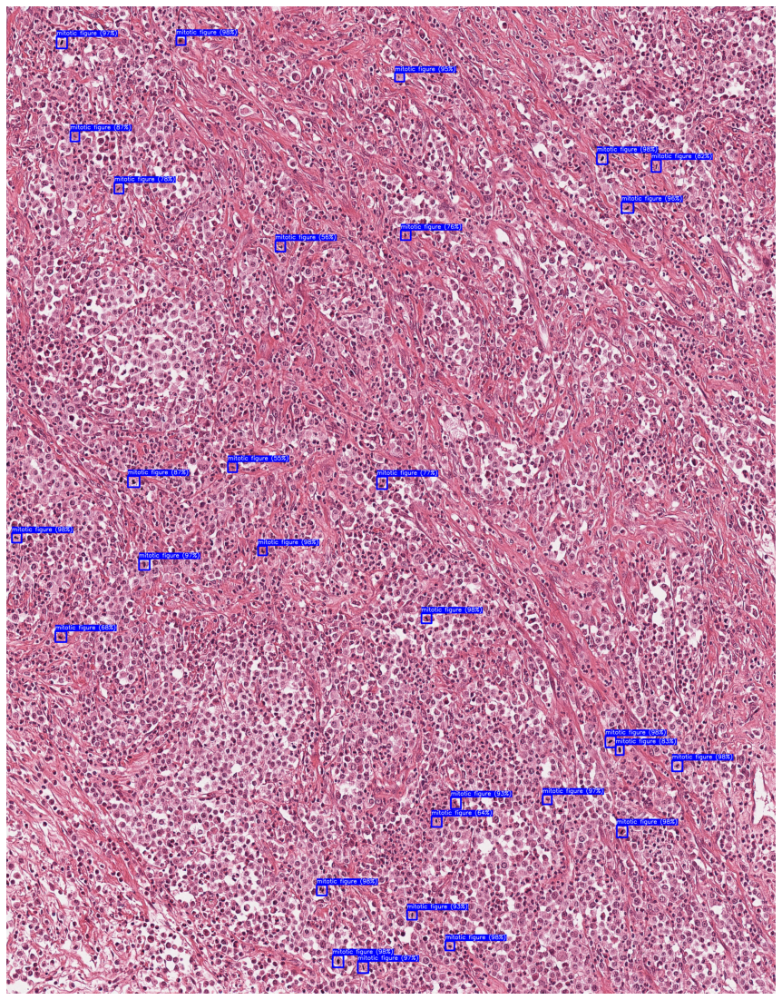

In [40]:
fig,ax = plt.subplots(figsize=[20,20])
show_img(roi_img_anno, ax)

<AxesSubplot:>

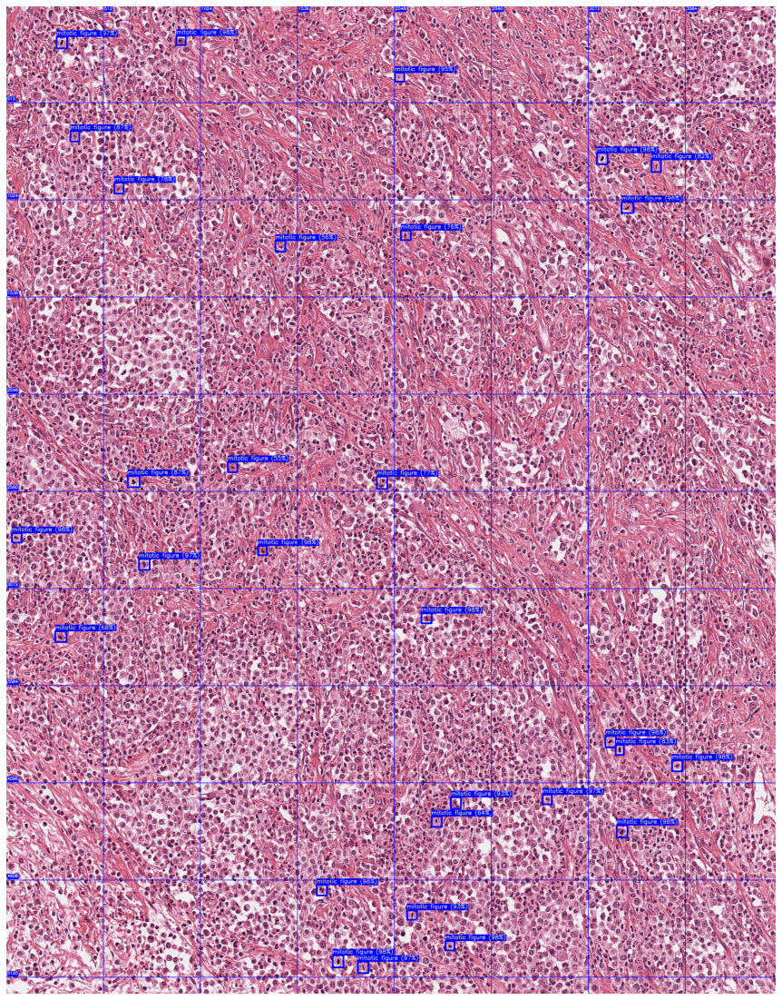

In [41]:
roi_img_grid = copy.deepcopy(roi_img_anno)
roi_img_grid = image_add_grid(roi_img_grid, params['size'], params['size'])
fig,ax = plt.subplots(figsize=[20,20])
show_img(roi_img_grid,ax)

In [47]:
#Create Output folder and filenames
output_filename_grid = 'preds_grid_' + roi_filename.split('.')[0] + '.jpg'
output_filename = 'preds_' + roi_filename.split('.')[0] + '.jpg'

#Save output image with grid and without grid
roi_img_grid = cv2.cvtColor(roi_img_grid, cv2.COLOR_BGR2RGB)
cv2.imwrite(str(output_fldr/output_filename_grid), roi_img_grid)

roi_img_anno = cv2.cvtColor(roi_img_anno, cv2.COLOR_BGR2RGB)
cv2.imwrite(str(output_fldr/output_filename), roi_img_anno)

True

<AxesSubplot:title={'center':'preds_grid_c91a842257ed2add5134_79007-45788.jpg'}>

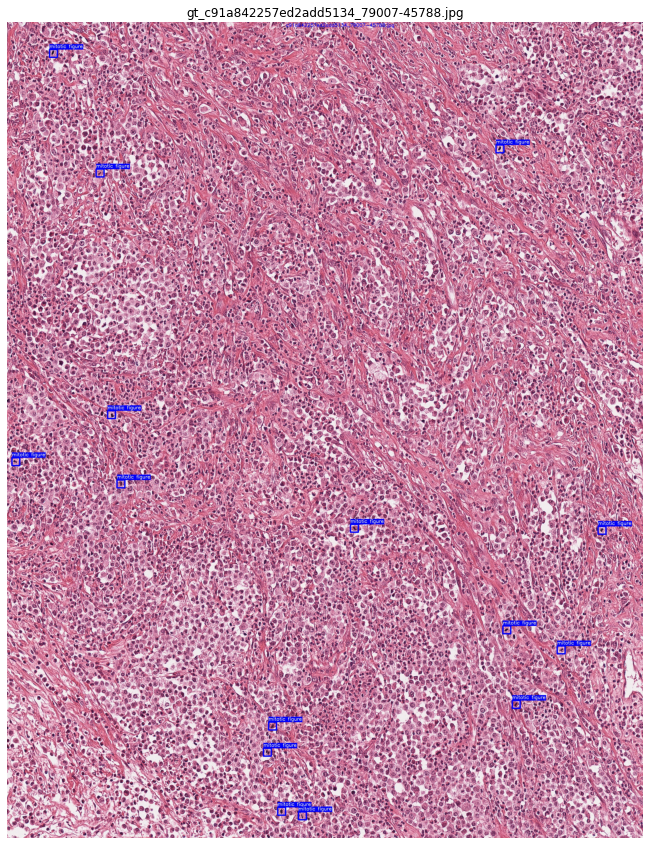

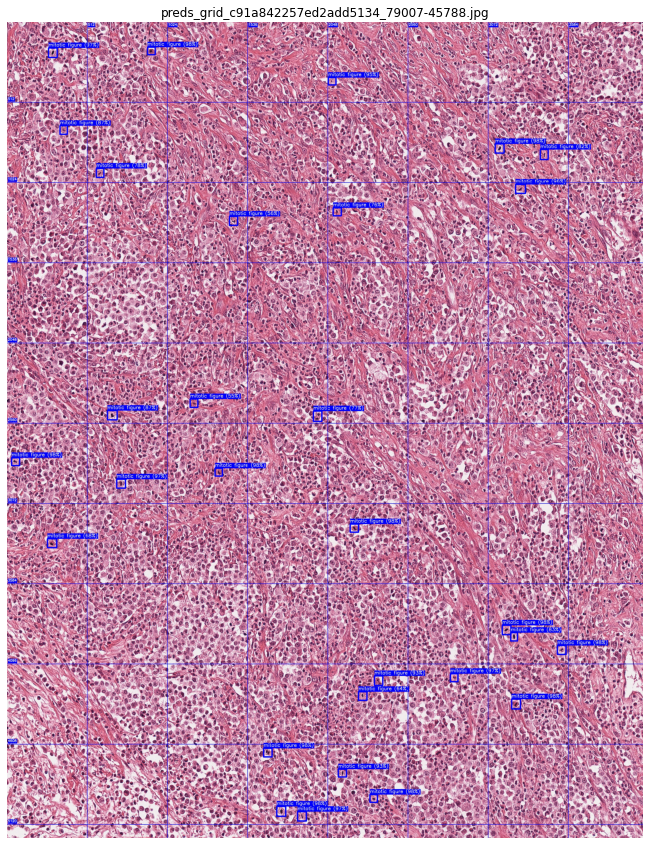

In [48]:
#Display ROI with Ground Truth Annotations
plot_size = [20,15]
pred_gt_fileroot = roi_filename.split('.')[0]
comp_pred_filename = 'preds_grid_' + pred_gt_fileroot + '.jpg'
comp_gt_filename = 'gt_' + pred_gt_fileroot + '.jpg'

#Open GT Image
fig,ax = plt.subplots(figsize=plot_size)
ax.set_title(comp_gt_filename)
img_output_gt = open_img(output_gt_fldr/comp_gt_filename)
show_img(img_output_gt, ax)

#Open Pred Image
fig,ax = plt.subplots(figsize=plot_size)
ax.set_title(comp_pred_filename)
img_output_gt = open_img(output_fldr/comp_pred_filename)
show_img(img_output_gt, ax)